# Capstone Project Notebook - The Battle of Neighborhoods

Importing required required dependencies

In [1]:
!conda install -c conda-forge folium=0.5.0 --yes
import pandas as pd
import numpy as np
from pandas.io.json import json_normalize 
from bs4 import BeautifulSoup 
import requests 
import json
import seaborn as sns
import matplotlib.pyplot as plt
import folium 
from folium import plugins
import matplotlib.cm as cm
import matplotlib.colors as col
from geopy.geocoders import Nominatim 
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import sklearn.utils
from sklearn.preprocessing import StandardScaler

Solving environment: done

# All requested packages already installed.



Scraping the list of postal codes of Toronto and creating our first dataframe

In [2]:
url = 'https://en.wikipedia.org/w/index.php?title=List_of_postal_codes_of_Canada:_M&oldid=945633050'
data = requests.get(url).text
soup = BeautifulSoup(data, 'lxml')
table = soup.find('table', {'class': 'wikitable sortable'})
columns_name = ['PostalCode', 'Borough', 'Neighborhood']
df = pd.DataFrame(columns = columns_name)
df

,PostalCode,Borough,Neighborhood


Filling the dataframe with the data we scraped from Wikipedia

In [3]:
for row in table.find_all('tr'):
    row_data=[]
    for data in row.find_all('td'):
        row_data.append(data.text.strip())
    if len(row_data)==3:
        df.loc[len(df)] = row_data

Here's what the dataframe looks like now

In [4]:
df.head(10)

,PostalCode,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Harbourfront
5,M6A,North York,Lawrence Heights
6,M6A,North York,Lawrence Manor
7,M7A,Downtown Toronto,Queen's Park
8,M8A,Not assigned,Not assigned
9,M9A,Etobicoke,Islington Avenue


Removing 'Not assigned' values from the Borough column

In [5]:
de = df [df['Borough'] == 'Not assigned'].index
df.drop(de, inplace=True)
df.loc[df['Neighborhood'] =='Not assigned' , 'Neighborhood'] = df['Borough']
r_df = df.groupby(['PostalCode', 'Borough'], sort=False).agg(', '.join)
df = r_df.reset_index()
df.head(10)

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,Harbourfront
3,M6A,North York,"Lawrence Heights, Lawrence Manor"
4,M7A,Downtown Toronto,Queen's Park
5,M9A,Etobicoke,Islington Avenue
6,M1B,Scarborough,"Rouge, Malvern"
7,M3B,North York,Don Mills North
8,M4B,East York,"Woodbine Gardens, Parkview Hill"
9,M5B,Downtown Toronto,"Ryerson, Garden District"


Reading a csv file locally stored in IBM cloud, the file contains geospatial coordinates of Toronto

In [6]:
import os, types
import pandas as pd
from botocore.client import Config
import ibm_boto3
def __iter__(self): return 0
if os.environ.get('RUNTIME_ENV_LOCATION_TYPE') == 'external':
    endpoint_45422a1df12848e1b6dd8cefeb73dedf = 'https://s3.eu.cloud-object-storage.appdomain.cloud'
else:
    endpoint_45422a1df12848e1b6dd8cefeb73dedf = 'https://s3.private.eu.cloud-object-storage.appdomain.cloud'
client_45422a1df12848e1b6dd8cefeb73dedf = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='JiLjohth3a9Ysr812SlPj99DbF-4nq0zLD4jc6WEn92s',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url=endpoint_45422a1df12848e1b6dd8cefeb73dedf)
body = client_45422a1df12848e1b6dd8cefeb73dedf.get_object(Bucket='courseracapstone-donotdelete-pr-wx2u4brhxefhzw',Key='Geospatial_Coordinates.csv')['Body']
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )
geo = pd.read_csv(body)
geo.head(10)


,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476
5,M1J,43.744734,-79.239476
6,M1K,43.727929,-79.262029
7,M1L,43.711112,-79.284577
8,M1M,43.716316,-79.239476
9,M1N,43.692657,-79.264848


Merging DF that contains Boroughs and Neighborhoods with GEO that contains geospatial coordinates

In [7]:
geo.columns = ['PostalCode', 'Latitude', 'Longitude']
t_df = pd.merge(df, geo, on='PostalCode')
t_df.head(10)

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,Harbourfront,43.654260,-79.360636
3,M6A,North York,"Lawrence Heights, Lawrence Manor",43.718518,-79.464763
4,M7A,Downtown Toronto,Queen's Park,43.662301,-79.389494
5,M9A,Etobicoke,Islington Avenue,43.667856,-79.532242
6,M1B,Scarborough,"Rouge, Malvern",43.806686,-79.194353
7,M3B,North York,Don Mills North,43.745906,-79.352188
8,M4B,East York,"Woodbine Gardens, Parkview Hill",43.706397,-79.309937
9,M5B,Downtown Toronto,"Ryerson, Garden District",43.657162,-79.378937


Scarping the GeoJSON file

In [8]:
url = 'https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=geojson&projection=4326'
geo_toronto = requests.get(url).json()

In [9]:
url_ward = 'https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/7672dac5-b383-4d7c-90ec-291dc69d37bf?format=geojson&projection=4326'
ward_geo = requests.get(url_ward).json()

Defining my Foursquare credentials and version for the API request URL, then the Foursquare category

In [10]:
CLIENT_ID, CLIENT_SECRET = 'YH35RXLK42JP41JLWUREXE0MYACNNX4N21EQMGEKIEUWQBGS','PZIFJCHLXQ55S2Q0CSFKKSMHRYBDI4BOR5NMX2XFULU5C1QX'
VERSION = '20180605' 
plc = '4bf58dd8d48988d1c3941735'

Defining a function that gets the category type

In [11]:
def get_category_type(row):
    try:
        ctg_list = row['categories']
    except:
        ctg_list = row['venue.categories']
        
    if len(ctg_list) == 0:
        return None
    else:
        return ctg_list[0]['name']

Defining a function that obtains Moroccan restaurants of every Toronto neighbourhood

In [12]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT = 300, radius = 2000, categoryId = plc):
    venues_list = []
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            categoryId)
        results = requests.get(url).json()['response']['groups'][0]['items']
        venues_list.append([(
            name,
            lat, 
            lng,
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood',
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue Name', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Storing the neighbourhoods in a new dataframe

In [13]:
nwm_df = getNearbyVenues(
                                names = t_df['Neighborhood'],
                                latitudes = t_df['Latitude'],
                                longitudes = t_df['Longitude']
                          )

Parkwoods
Victoria Village
Harbourfront
Lawrence Heights, Lawrence Manor
Queen's Park
Islington Avenue
Rouge, Malvern
Don Mills North
Woodbine Gardens, Parkview Hill
Ryerson, Garden District
Glencairn
Cloverdale, Islington, Martin Grove, Princess Gardens, West Deane Park
Highland Creek, Rouge Hill, Port Union
Flemingdon Park, Don Mills South
Woodbine Heights
St. James Town
Humewood-Cedarvale
Bloordale Gardens, Eringate, Markland Wood, Old Burnhamthorpe
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Downsview North, Wilson Heights
Thorncliffe Park
Adelaide, King, Richmond
Dovercourt Village, Dufferin
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
East Toronto
Harbourfront East, Toronto Islands, Union Station
Little Portugal, Trinity
East Birchmount Park, Ionview, Kennedy Park
Bayview Village
CFB Toronto, Downsview East
The Danforth West,

Defining and setting up the coordinates of Toronto

In [14]:
address = 'Toronto, ON'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

Importing neighbourhood profiles dataframe

In [15]:
body = client_45422a1df12848e1b6dd8cefeb73dedf.get_object(Bucket='courseracapstone-donotdelete-pr-wx2u4brhxefhzw',Key='neighbourhood-profiles-2016-csv.csv')['Body']
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )
neighbourhood_profiles = pd.read_csv(body)
neighbourhood_profiles.head(10)

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,NaN,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,NaN,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2016","2,731,571","29,113","23,757","12,054","30,526",...,"16,936","22,156","53,485","12,541","7,865","14,349","11,817","12,528","27,593","14,804"
3,4,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2011","2,615,060","30,279","21,988","11,904","29,177",...,"15,004","21,343","53,350","11,703","7,826","13,986","10,578","11,652","27,713","14,687"
4,5,Population,Population and dwellings,Census Profile 98-316-X2016001,Population Change 2011-2016,4.50%,-3.90%,8.00%,1.30%,4.60%,...,12.90%,3.80%,0.30%,7.20%,0.50%,2.60%,11.70%,7.50%,-0.40%,0.80%
5,6,Population,Population and dwellings,Census Profile 98-316-X2016001,Total private dwellings,"1,179,057","9,371","8,535","4,732","18,109",...,"8,054","8,721","19,098","5,620","3,604","6,185","6,103","7,475","11,051","5,847"
6,7,Population,Population and dwellings,Census Profile 98-316-X2016001,Private dwellings occupied by usual residents,"1,112,929","9,120","8,136","4,616","15,934",...,"7,549","8,509","18,436","5,454","3,449","5,887","5,676","7,012","10,170","5,344"
7,8,Population,Population and dwellings,Census Profile 98-316-X2016001,Population density per square kilometre,"4,334","3,929","3,034","2,435","10,863",...,"5,820","4,007","4,345","7,838","6,722","8,541","7,162","10,708","2,086","2,451"
8,9,Population,Population and dwellings,Census Profile 98-316-X2016001,Land area in square kilometres,630.2,7.41,7.83,4.95,2.81,...,2.91,5.53,12.31,1.6,1.17,1.68,1.65,1.17,13.23,6.04
9,10,Population,Age characteristics,Census Profile 98-316-X2016001,Children (0-14 years),"398,135","3,840","3,075","1,760","2,360",...,"1,785","3,555","9,625","2,325","1,165","1,860","1,800","1,210","4,045","1,960"


Locating the row with African origins' data

In [16]:
test = neighbourhood_profiles.iloc[[0,1138]].transpose().reset_index()
test.head(10)

,index,0,1138
0,_id,1,1139
1,Category,Neighbourhood Information,Immigration and citizenship
2,Topic,Neighbourhood Information,Immigrants by selected place of birth
3,Data Source,City of Toronto,Census Profile 98-316-X2016001
4,Characteristic,Neighbourhood Number,Africa
5,City of Toronto,NaN,"77,445"
6,Agincourt North,129,445
7,Agincourt South-Malvern West,128,350
8,Alderwood,20,100
9,Annex,95,620


Droping other unnecessary rows and renaming the columns and changing the data types of the Population and Neighbourhood Number columns

In [17]:
new_df = test.iloc[6:]
new_df.columns = ['Neighborhood','Neighbourhood Number','Population']
new_df = new_df.set_index('Neighborhood')[['Neighbourhood Number','Population']]
new_df['Population'] = new_df['Population'].replace(',','', regex = True).astype(float)
new_df['Neighbourhood Number'] = new_df['Neighbourhood Number'].astype(float)
new_df.head(10)

,Neighbourhood Number,Population
Neighborhood,,
Agincourt North,129.0,445.0
Agincourt South-Malvern West,128.0,350.0
Alderwood,20.0,100.0
Annex,95.0,620.0
Banbury-Don Mills,42.0,1070.0
Bathurst Manor,34.0,260.0
Bay Street Corridor,76.0,620.0
Bayview Village,52.0,375.0
Bayview Woods-Steeles,49.0,265.0


Scraping Business Improvement Areas data

In [18]:
url = 'https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/d173e644-ace0-45e0-be43-8ba02fb116eb?format=geojson&projection=4326'
geo_area = requests.get(url).json()

Creating a dataframe which contains number of neighborhoods for each borough

In [19]:
nn = t_df.groupby('Borough')['Neighborhood'].count().sort_values(ascending=False).to_frame()
nn

,Neighborhood
Borough,
North York,24
Downtown Toronto,19
Scarborough,17
Etobicoke,12
Central Toronto,9
West Toronto,6
York,5
East York,5
East Toronto,5


Setting up a plot that represents the above dataframe

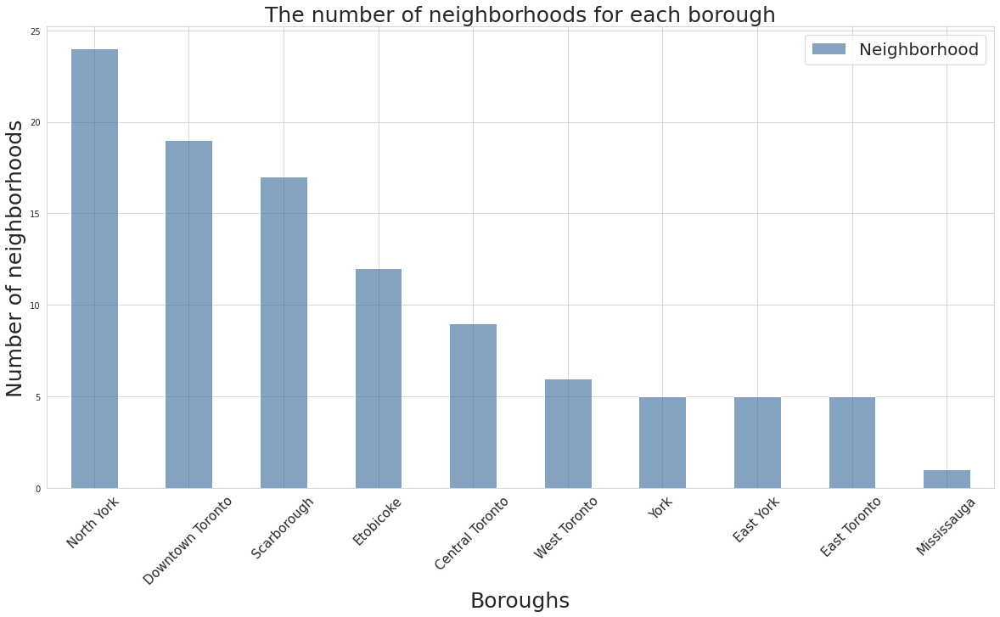

In [20]:
sns.set_style('whitegrid')
sns.set_palette('Dark2')
nn.plot(kind='bar', figsize=(20,10), color=(0.2, 0.4, 0.6, 0.6))
plt.ylabel('Number of neighborhoods', size=25)
plt.xlabel('Boroughs', size=25)
plt.title('The number of neighborhoods for each borough', size=25)
plt.xticks(rotation=45, size=15)
plt.legend(fontsize=20)
plt.show()

Now we create a map of Toronto and it's neighborhoods

In [21]:
toronto_map = folium.Map(location=[latitude, longitude], zoom_start=10)
for lat, lng, borough, neighborhood in zip(t_df['Latitude'], t_df['Longitude'], t_df['Borough'],
                                          t_df['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [lat, lng],
    radius=5,
    popup=label,
    color=(0.2, 0.4, 0.6),
    fill=True,
    fill_color='purple',
    fill_opacity=0.6,
    parse_html=False).add_to(toronto_map)
toronto_map

Let's get back to our dataframe tha contains population and neighbourhood number data

In [22]:
new_df.head(10)

,Neighbourhood Number,Population
Neighborhood,,
Agincourt North,129.0,445.0
Agincourt South-Malvern West,128.0,350.0
Alderwood,20.0,100.0
Annex,95.0,620.0
Banbury-Don Mills,42.0,1070.0
Bathurst Manor,34.0,260.0
Bay Street Corridor,76.0,620.0
Bayview Village,52.0,375.0
Bayview Woods-Steeles,49.0,265.0


Let's make a new dataframe out of it that contains the population of African origins of each neighborhood 

In [23]:
nd_gp = new_df.groupby('Neighborhood')['Population'].sum().sort_values(ascending=False).to_frame()
nd_gp

,Population
Neighborhood,
Kingsview Village-The Westway,2575.0
Mount Olive-Silverstone-Jamestown,2570.0
Waterfront Communities-The Island,1775.0
Flemingdon Park,1675.0
Black Creek,1655.0
...,...
Markland Wood,90.0
University,80.0
Kingsway South,70.0


And make a new dataframe that contains neighborhoods populated with more than 1000 African origin

In [24]:
africa_top = nd_gp[nd_gp['Population'] > 1000]
at = africa_top.head(10)
africa_top

,Population
Neighborhood,
Kingsview Village-The Westway,2575.0
Mount Olive-Silverstone-Jamestown,2570.0
Waterfront Communities-The Island,1775.0
Flemingdon Park,1675.0
Black Creek,1655.0
West Humber-Clairville,1610.0
Glenfield-Jane Heights,1555.0
Weston,1490.0
L'Amoreaux,1370.0


Let's turn it into a plot of it's top 10 of the most populated

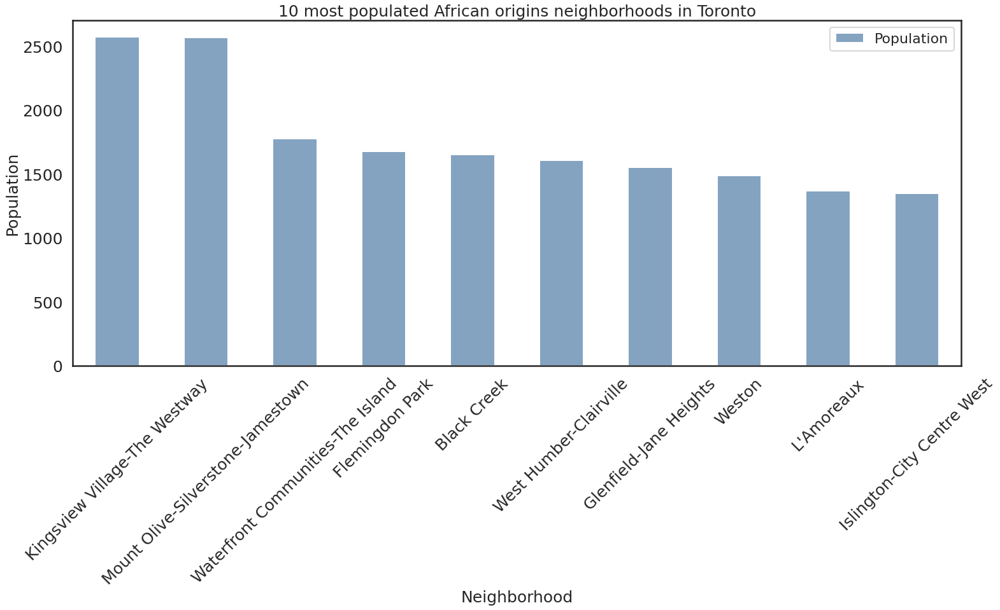

In [25]:
sns.set_style('white')
sns.set_context('poster')
at.plot(kind='bar', figsize=(25,10), color=(0.2, 0.4, 0.6, 0.6))
plt.xlabel('Neighborhood', size=25)
plt.ylabel('Population', size=25)
plt.title('10 most populated African origins neighborhoods in Toronto', size=25)
plt.xticks(rotation=45, size=25)
plt.yticks(size=20)
plt.yticks(size=25)
plt.show()

In [26]:
africa_bot = nd_gp[nd_gp['Population'] <= 105]
africa_bot

,Population
Neighborhood,
Long Branch,105.0
Caledonia-Fairbank,100.0
Alderwood,100.0
Playter Estates-Danforth,90.0
North Riverdale,90.0
Markland Wood,90.0
University,80.0
Kingsway South,70.0
Woodbine-Lumsden,70.0


same thing here but for the least populated

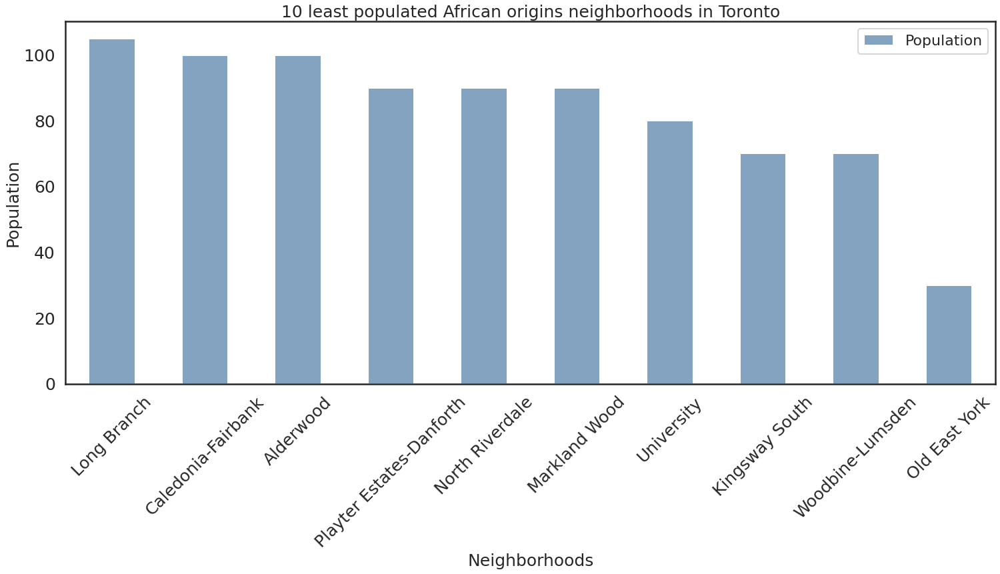

In [27]:
sns.set_style('white')
sns.set_context('poster')
africa_bot.plot(kind='bar', figsize=(25,10), color=(0.2, 0.4, 0.6, 0.6))
plt.xlabel('Neighborhoods', size=25)
plt.ylabel('Population', size=25)
plt.title('10 least populated African origins neighborhoods in Toronto', size=25)
plt.xticks(rotation=45, size=25)
plt.yticks(size=20)
plt.yticks(size=25)
plt.show()

After exploring the population, let's explore the restaurants so let's get back to our neighborhood dataframe

In [28]:
nwm_df.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Latitude,Venue Longitude,Venue Category
0,Harbourfront,43.654260,-79.360636,The Sultan's Tent and Cafe Moroc,43.647928,-79.374341,Moroccan Restaurant
1,Harbourfront,43.654260,-79.360636,Berber SOCIAL,43.648114,-79.374046,Moroccan Restaurant
2,Harbourfront,43.654260,-79.360636,Cluny Bistro & Boulangerie,43.650565,-79.357843,French Restaurant
3,Harbourfront,43.654260,-79.360636,Balzac's Coffee,43.657854,-79.379200,Coffee Shop
4,Harbourfront,43.654260,-79.360636,JOEY Eaton Centre,43.656094,-79.381878,New American Restaurant
5,Queen's Park,43.662301,-79.389494,Balzac's Coffee,43.657854,-79.379200,Coffee Shop
6,Queen's Park,43.662301,-79.389494,Duke of York,43.669186,-79.397527,Pub
7,Queen's Park,43.662301,-79.389494,JOEY Eaton Centre,43.656094,-79.381878,New American Restaurant
8,"Ryerson, Garden District",43.657162,-79.378937,The Sultan's Tent and Cafe Moroc,43.647928,-79.374341,Moroccan Restaurant
9,"Ryerson, Garden District",43.657162,-79.378937,Berber SOCIAL,43.648114,-79.374046,Moroccan Restaurant


In [29]:
nwm_df.groupby('Venue Category')['Venue Category'].count().sort_values(ascending=False).to_frame()

,Venue Category
Venue Category,
Moroccan Restaurant,35
Coffee Shop,18
New American Restaurant,16
Pub,13
French Restaurant,9
Middle Eastern Restaurant,7
Jewish Restaurant,3
Café,2
Hookah Bar,1


Let's remove rows with other venue categories and keep the ones with Moroccan Restaurant category

In [30]:
nwm_df = nwm_df[nwm_df['Venue Category'] == 'Moroccan Restaurant']
nwm_df.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Name,Venue Latitude,Venue Longitude,Venue Category
0,Harbourfront,43.654260,-79.360636,The Sultan's Tent and Cafe Moroc,43.647928,-79.374341,Moroccan Restaurant
1,Harbourfront,43.654260,-79.360636,Berber SOCIAL,43.648114,-79.374046,Moroccan Restaurant
8,"Ryerson, Garden District",43.657162,-79.378937,The Sultan's Tent and Cafe Moroc,43.647928,-79.374341,Moroccan Restaurant
9,"Ryerson, Garden District",43.657162,-79.378937,Berber SOCIAL,43.648114,-79.374046,Moroccan Restaurant
13,Woodbine Heights,43.695344,-79.318389,D-One Moroccan Cafe,43.682163,-79.331722,Moroccan Restaurant
14,St. James Town,43.651494,-79.375418,The Sultan's Tent and Cafe Moroc,43.647928,-79.374341,Moroccan Restaurant
15,St. James Town,43.651494,-79.375418,Berber SOCIAL,43.648114,-79.374046,Moroccan Restaurant
20,Berczy Park,43.644771,-79.373306,The Sultan's Tent and Cafe Moroc,43.647928,-79.374341,Moroccan Restaurant
21,Berczy Park,43.644771,-79.373306,Berber SOCIAL,43.648114,-79.374046,Moroccan Restaurant
25,Central Bay Street,43.657952,-79.387383,The Sultan's Tent and Cafe Moroc,43.647928,-79.374341,Moroccan Restaurant


Let's make a new dataframe to see how many Moroccan restaurants are in each Neighborhood

In [31]:
mrc_nh = nwm_df[['Neighborhood', 'Venue Name']].groupby(['Neighborhood']).size().reset_index(name='Number of Moroccan Restaurants')
mrc_nh.sort_values('Number of Moroccan Restaurants', ascending=False, inplace=True)
mrc_nh = mrc_nh.reset_index().drop('index', axis=1).set_index('Neighborhood')
mrc_nh

,Number of Moroccan Restaurants
Neighborhood,
"The Danforth West, Riverdale",3
East Toronto,3
"Adelaide, King, Richmond",2
"Harbourfront East, Toronto Islands, Union Station",2
"The Beaches West, India Bazaar",2
Stn A PO Boxes 25 The Esplanade,2
St. James Town,2
"Ryerson, Garden District",2
Harbourfront,2


Let's merge the above dataframe with our t_df which we previously created to contain data about Toronto

In [32]:
mrc = pd.merge(t_df, mrc_nh, how = 'right', on = ['Neighborhood'] )
mrc

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Number of Moroccan Restaurants
0,M5A,Downtown Toronto,Harbourfront,43.654260,-79.360636,2
1,M5B,Downtown Toronto,"Ryerson, Garden District",43.657162,-79.378937,2
2,M4C,East York,Woodbine Heights,43.695344,-79.318389,1
3,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418,2
4,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306,2
5,M5G,Downtown Toronto,Central Bay Street,43.657952,-79.387383,2
6,M1H,Scarborough,Cedarbrae,43.773136,-79.239476,1
7,M4H,East York,Thorncliffe Park,43.705369,-79.349372,1
8,M5H,Downtown Toronto,"Adelaide, King, Richmond",43.650571,-79.384568,2
9,M4J,East York,East Toronto,43.685347,-79.338106,3


In [33]:
mrc_boro = mrc[['Borough', 'Number of Moroccan Restaurants']].groupby(['Borough']).sum().sort_values('Number of Moroccan Restaurants', ascending=False)
mrc_boro

,Number of Moroccan Restaurants
Borough,
Downtown Toronto,22
East Toronto,5
East York,5
Scarborough,2
Etobicoke,1


Looks like Downtown Toronto has the most Moroccan Restaurants and follows it East Toronto and East York, let's make a map and see these's restaurants' concentration

In [34]:
restaurants_map = folium.Map(location=[latitude,longitude], tiles='cartodbpositron', zoom_start=11)
restaurants_map.choropleth(
    geo_data=geo_area,
    data = new_df,
    columns=['Neighbourhood Number','Population'],
    key_on='feature.properties.AREA_SHORT_CODE',
    line_weight = 0.2,
    fill_color='YlOrBr',
    fill_opacity= 0.3,
    line_opacity= 0.2, 
    name = 'Choropleth Map of Neighborhoods')
ward_style = lambda x: {'fillColor': '#aeaeae', 'color': '#aeaeae','fillOpacity':'0.1'}
folium.GeoJson(
    ward_geo,
    style_function = ward_style,
).add_to(restaurants_map)
for index,row in nwm_df.iterrows():
    folium.CircleMarker(
        [row["Venue Latitude"], row["Venue Longitude"]],
        radius=5,
        color='purple',
        fill= True,
        fill_color='purple',
        fill_opacity= 0.1,
        popup='Moroccan Restaurant',
    ).add_to(restaurants_map)
restaurants_map

In [35]:
nwm_arr = nwm_df[['Venue Latitude', 'Venue Longitude']].values
nwm_arr = nwm_arr.tolist()

Let's turn it into a heat map

Now let's create a map for business improvement area

In [37]:
business_improvement_map = folium.Map(location=[latitude,longitude], tiles='cartodbpositron', zoom_start=10)
for index,row in nwm_df.iterrows():
    folium.CircleMarker(
        [row["Venue Latitude"], row["Venue Longitude"]],
        radius=5,
        color='purple',
        fill= True,
        fill_color='purple',
        fill_opacity= 0.1,
        popup='Japanese Restaurant',
    ).add_to(business_improvement_map)
business_improvement_map
ward_style = lambda x: {'fillColor': 'grey', 'color': 'grey','fillOpacity':'0.1'}
folium.GeoJson(
    ward_geo,
    style_function = ward_style
).add_to(business_improvement_map)
area_style = lambda x: {'fillColor': 'black', 'color': 'black','fillOpacity':'0.2'}
folium.GeoJson(
    geo_area,
    style_function = area_style,
    name='Business Improvement Areas'
).add_to(business_improvement_map)
business_improvement_map

Now let's prepare our data for DBSCAN 

In [38]:
xs = np.asarray(nwm_df['Venue Latitude']) 
ys = np.asarray(nwm_df['Venue Longitude'])

In [39]:
nwm_df['xm'] = xs.tolist()
nwm_df['ym'] = ys.tolist()

In [40]:
cluster_data = nwm_df[['xm', 'ym']]
cluster_data = np.nan_to_num(cluster_data)
cluster_data

array([[ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.68216302, -79.33172234],
       [ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.77502465, -79.25711558],
       [ 43.68843248, -79.34854409],
       [ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.68216302, -79.33172234],
       [ 43.68018404, -79.33395038],
       [ 43.68843248, -79.34854409],
       [ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.68843248, -79.34854409],
       [ 43.68018404, -79.33395038],
       [ 43.68216302, -79.33172234],
       [ 43.64792783, -79.37434095],
       [ 43.64811375, -79.37404623],
       [ 43.68216302, -79.33172234],
       [ 43.68018404, -79.33395038],
 

Now let's move to DBSCAN modeling

In [49]:
neigh = NearestNeighbors(n_neighbors=len(cluster_data))
nbrs = neigh.fit(cluster_data)
distances, indices = nbrs.kneighbors(cluster_data)
distances.mean()

0.04431695308297203

In [50]:
distances = np.sort(distances, axis=0)
distances = distances[:,-1]

Let's graph the optimal Epsilon values

Text(30, 0.205, 'Optimal Epsilon Value')

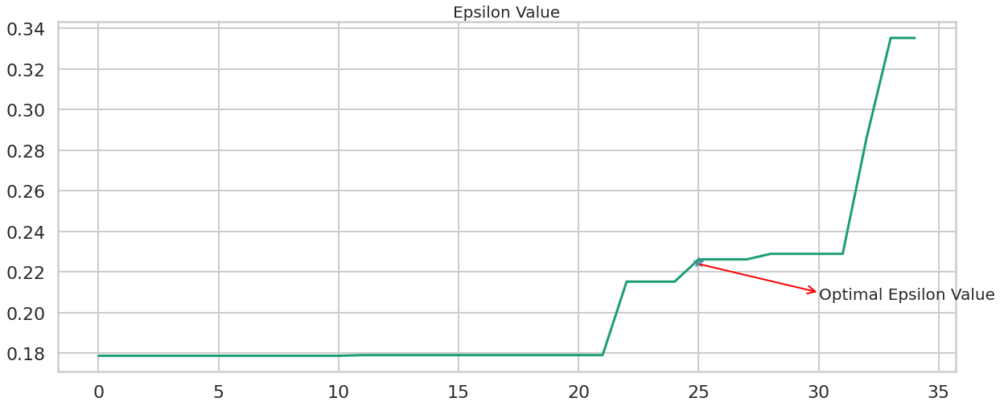

In [51]:
sns.set_style('whitegrid')
sns.set_context('poster')
sns.set_palette('Dark2')
plt.figure(figsize=(20,8))
plt.plot(distances)
plt.scatter(x=25, y=0.225, color=(0.2, 0.4, 0.6, 0.6), marker='*')
plt.title('Epsilon Value', size=20)
plt.annotate('',
            xy=(25, 0.224),
            xytext=(30, 0.21),
            xycoords='data',
            arrowprops=dict(arrowstyle='<-', connectionstyle='arc3', color='red', lw=2))
plt.annotate('Optimal Epsilon Value',
             xy=(30, 0.205),
             va='bottom',
             ha='left',
             fontsize=20
            )

In [52]:
cluster_data = StandardScaler().fit_transform(cluster_data)

In [53]:
db = DBSCAN(eps=0.35, min_samples=6).fit(cluster_data)
labels = db.labels_
labels

array([ 0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  1,  1,
       -1,  0,  0, -1,  1,  1,  0,  0,  1,  1,  0,  0, -1,  0,  0, -1,  0,
        0])

In [54]:
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
nwm_df["Cluster_DB"]=labels

realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels))

In [55]:
nwm_df[['Neighborhood', 'Venue Name', 'Cluster_DB']]

,Neighborhood,Venue Name,Cluster_DB
0,Harbourfront,The Sultan's Tent and Cafe Moroc,0
1,Harbourfront,Berber SOCIAL,0
8,"Ryerson, Garden District",The Sultan's Tent and Cafe Moroc,0
9,"Ryerson, Garden District",Berber SOCIAL,0
13,Woodbine Heights,D-One Moroccan Cafe,1
14,St. James Town,The Sultan's Tent and Cafe Moroc,0
15,St. James Town,Berber SOCIAL,0
20,Berczy Park,The Sultan's Tent and Cafe Moroc,0
21,Berczy Park,Berber SOCIAL,0
25,Central Bay Street,The Sultan's Tent and Cafe Moroc,0


In [56]:
set(labels)

{-1, 0, 1}

In [57]:
nwm_df['Cluster_DB'] = nwm_df['Cluster_DB'].astype(int).tolist()
k_clusters = nwm_df['Cluster_DB'].max() + 1 
k_clusters

2

In [58]:
nwm_df.groupby('Cluster_DB')['Venue Name'].count().sort_values(ascending=False).to_frame()

,Venue Name
Cluster_DB,
0,22
1,7
-1,6


Let's visualize the results

In [59]:
x = np.arange(k_clusters)
ys = [i + x + (i*x)**2 for i in range(k_clusters)]
colors_array = cm.tab20(np.linspace(0, 1, len(ys)))
rainbow = [col.rgb2hex(i) for i in colors_array]
db_map = folium.Map(location=[latitude, longitude], zoom_start=10)
for lat, lon, neigh, cluster in zip(nwm_df['Venue Latitude'], nwm_df['Venue Longitude'],
                                    nwm_df['Neighborhood'], nwm_df['Cluster_DB']):
    label = folium.Popup(str(neigh) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color = 'purple',
        fill=True,
        fill_color=rainbow[cluster-0],
        fill_opacity=0.7).add_to(db_map)
db_map

Let's improve the looks

In [60]:
x = np.arange(k_clusters)
ys = [i + x + (i*x)**2 for i in range(k_clusters)]
colors_array = cm.tab20(np.linspace(0, 1, len(ys)))
rainbow = [col.rgb2hex(i) for i in colors_array]
business_improvement_map.choropleth(
    geo_data=geo_toronto,
    data = new_df,
    columns=['Neighbourhood Number','Population'],
    key_on='feature.properties.AREA_SHORT_CODE',
    line_weight = 0.2,
    fill_color='YlOrBr',
    fill_opacity= 0.3,
    line_opacity= 0.2, 
    legend_name='Population of African origins',
    name = 'Choropleth Map of Neighborhoods 140')
for lat, lon, neigh, cluster in zip(nwm_df['Venue Latitude'], nwm_df['Venue Longitude'],
                                    nwm_df['Neighborhood'], nwm_df['Cluster_DB']):
    label = folium.Popup(str(neigh) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='purple',
        fill=True,
        fill_color=rainbow[cluster-0],
        fill_opacity=0.7).add_to(business_improvement_map)
business_improvement_map

We can notice 3 locations that can be considered candidates to have a new successful Moroccan restaurant:
* First Canadian Place, Underground city
* Alderwood, Long Branch
* Maryvale, Wexford